# Geographical Analysis

Often when evaluating a smaller company, it becomes crucial to understand the market they operate within. Let's take a hypothetical start up that wants to buy apartments, starting in Boston, and provide much more flexible leases to their tenants among other things. Their idea is that the apartment market is in need of innovation. Before they begin buying up properties, they need to know exactly what the landscape looks like. Thankfully, the city of Boston has a free dataset which gives us the tax assessments for land value that we will use here.

You can find the data here for yourself or download the data from github: <a href=https://data.boston.gov/dataset/property-assessment>Boston Data</a>

As always begin with reading in the data.

In [1]:
import pandas as pd

#Read in the dataset
df = pd.read_csv('2015 Real Estate.csv')
print(df)

                PID        CM_ID ST_NUM     ST_NAME ST_NAME_SUF UNIT_NUM  \
0       1302299000_          NaN    199  SAVIN HILL          AV      NaN   
1       1302298000_          NaN    195  SAVIN HILL          AV      NaN   
2       1302297000_          NaN    193  SAVIN HILL          AV      NaN   
3       1302296000_          NaN    6 8   SOUTHVIEW          ST      NaN   
4       1302295000_          NaN  10 12   SOUTHVIEW          ST      NaN   
...             ...          ...    ...         ...         ...      ...   
168110  1302300006_  1302300000_    201  SAVIN HILL          AV        3   
168111  1302300004_  1302300000_    201  SAVIN HILL          AV        2   
168112  1302300002_  1302300000_    201  SAVIN HILL          AV        1   
168113  1302300000_  1302300000_    201  SAVIN HILL          AV      NaN   
168114  1302300000_  1302300000_    201  SAVIN HILL          AV      NaN   

       ZIPCODE          full_address  PTYPE  LU  ... U_ORIENT U_TOT_RMS  \
0       0212

From the data key, we see that the column LU is going to denote land use with different codes. With the function value_counts, we get a clearer picture of what the makeup of the data is in terms of the land use.

In [2]:
#Find value counts
print(df['LU'].value_counts())

CD    59909
R1    30726
R2    17464
R3    14176
CM     8970
E      8591
RL     7015
C      4565
CP     3554
A      2937
RC     2575
R4     2567
CL     2186
CC     1765
EA      614
I       497
AH        3
XX        1
Name: LU, dtype: int64


Residential condos are the most common, followed by 1 family homes. Let's begin our analysis by looking at the 1-family homes (code R1). We are going to make a copy of the dataframe (so that we can make changes to it and not worry about messing with the original dataframe) and slice it to be only properties with that R1 code.

In [3]:
r1 = df[df['LU'] == 'R1'].copy()
print(r1)

                PID CM_ID ST_NUM     ST_NAME ST_NAME_SUF UNIT_NUM ZIPCODE  \
41      1302268030_   NaN     12       DENNY          ST      NaN  02125_   
42      1302268020_   NaN     18       DENNY          ST      NaN  02125_   
60      1302260000_   NaN     44  SPRINGDALE          ST      NaN  02125_   
77      1302251000_   NaN    161  SAVIN HILL          AV      NaN  02125_   
85      1302236000_   NaN     23   PLAYSTEAD          RD      NaN  02125_   
...             ...   ...    ...         ...         ...      ...     ...   
168101  1302306000_   NaN    215  SAVIN HILL          AV      NaN  02125_   
168102  1302305000_   NaN    213  SAVIN HILL          AV      NaN  02125_   
168104  1302303000_   NaN    207  SAVIN HILL          AV      NaN  02125_   
168105  1302302000_   NaN    205  SAVIN HILL          AV      NaN  02125_   
168106  1302301000_   NaN    203  SAVIN HILL          AV      NaN  02125_   

                full_address  PTYPE  LU  ... U_ORIENT U_TOT_RMS U_BDRMS  \


Now, there are a lot of columns that seem to have null values. How do we know which are not going to be of any use? One solution is to combine pd.isnull() which returns True/False based on null values with the function to find the mean value of a column. Since True/False is the same as 1/0, calling for the mean of the columns based on this will return the percent of records which are null!

In [4]:
#Find percent of the time values are null
print(pd.isnull(r1).mean())

PID                   0.000000
CM_ID                 0.999967
ST_NUM                0.000000
ST_NAME               0.000000
ST_NAME_SUF           0.000879
UNIT_NUM              1.000000
ZIPCODE               0.000000
full_address          0.000000
PTYPE                 0.000000
LU                    0.000000
OWN_OCC               0.000000
OWNER                 0.000000
OWNER_MAIL_ADDRESS    0.000000
OWNER_MAIL_CS         0.000000
OWNER_MAIL_ZIPCODE    0.000000
AV_LAND               0.000000
AV_BLDG               0.000000
AV_TOTAL              0.000000
GROSS_TAX             0.000000
LAND_SF               0.000325
YR_BUILT              0.000000
YR_REMOD              0.050413
GROSS_AREA            0.000000
LIVING_AREA           0.000000
NUM_FLOORS            0.000033
STRUCTURE_CLASS       0.006379
R_BLDG_STYL           0.000033
R_ROOF_TYP            0.000033
R_EXT_FIN             0.000033
R_TOTAL_RMS           0.000033
R_BDRMS               0.000033
R_FULL_BTH            0.000033
R_HALF_B

Let's round up any columns that have a null percent greater than 20% and drop them.

In [5]:
#Drop the columns

#Find the columns to drop
columns_to_drop = r1.columns[pd.isnull(r1).mean() > .2]
print("Columns to drop:")
print(columns_to_drop)
print()
#Drop the columns
r1 = r1.drop(columns=columns_to_drop)
print(r1)

Columns to drop:
Index(['CM_ID', 'UNIT_NUM', 'S_NUM_BLDG', 'S_BLDG_STYL', 'S_UNIT_RES',
       'S_UNIT_COM', 'S_UNIT_RC', 'S_EXT_FIN', 'U_BASE_FLOOR', 'U_NUM_PARK',
       'U_CORNER', 'U_ORIENT', 'U_TOT_RMS', 'U_BDRMS', 'U_FULL_BTH',
       'U_HALF_BTH', 'U_KIT_TYPE', 'U_HEAT_TYP', 'U_AC', 'U_FPLACE'],
      dtype='object')

                PID ST_NUM     ST_NAME ST_NAME_SUF ZIPCODE  \
41      1302268030_     12       DENNY          ST  02125_   
42      1302268020_     18       DENNY          ST  02125_   
60      1302260000_     44  SPRINGDALE          ST  02125_   
77      1302251000_    161  SAVIN HILL          AV  02125_   
85      1302236000_     23   PLAYSTEAD          RD  02125_   
...             ...    ...         ...         ...     ...   
168101  1302306000_    215  SAVIN HILL          AV  02125_   
168102  1302305000_    213  SAVIN HILL          AV  02125_   
168104  1302303000_    207  SAVIN HILL          AV  02125_   
168105  1302302000_    205  SAVIN HILL          AV  0

## Location

The location column needs to be worked with to be useable. First, let's see what the format is. It is overall going to be latitude/longitude that we get out of it at the end.

In [6]:
#Print a sample location
print(r1['Location'].values[0])

(42.309030000| -71.050840000)


Because this is a string, we need to do 2 things to get it into a format we can use. First of all, we are going to ahve to get rid of the parentheses. After that, we need to split the string in two to get the latitude and longitude separate. If we split on "| ", we should get an even split. Below is an example of replacing the parentheses with nothing, then doing this split.

In [7]:
print(r1['Location'].values[0].replace("(", "").replace(")", "").split("| "))

['42.309030000', '-71.050840000']


Let's now take this logic and apply it to each row. We need two more things to be done here. First, we want to convert the strings in the list to floats, and then also we are going to need to index each position for the respective column.

In [8]:
#Get rid of any null values
r1 = r1[~pd.isnull(r1['Location'])]

#Get the latitude
r1['Latitude'] = r1['Location'].apply(lambda x: x.replace("(", "").replace(")", "").split("| ")[0]).astype(float)

#Get the longitude
r1['Longitude'] = r1['Location'].apply(lambda x: x.replace("(", "").replace(")", "").split("| ")[1]).astype(float)

#Get rid of any that have 0 for the latitude (not a valid location)
r1 = r1[r1['Latitude'] != 0]

print(r1[['Latitude', 'Longitude']])

        Latitude  Longitude
41      42.30903  -71.05084
42      42.30890  -71.05096
60      42.30888  -71.05145
77      42.30973  -71.05124
85      42.30932  -71.05208
...          ...        ...
168101  42.30886  -71.04791
168102  42.30879  -71.04813
168104  42.30862  -71.04868
168105  42.30847  -71.04862
168106  42.30856  -71.04887

[30373 rows x 2 columns]


# Folium

Folium is a great library in python which allows us to plot things on actual maps. If you do not yet have it installed, you will need to pip install it. As for how to use it, let's begin with how to create your first map. We create a map object by calling folium.Map() and giving the arguments of location (the latitude and longitude as a list) and how far in we want the zoom to be in the beginning. Below are arguments that center the map on Boston.

In [9]:
import folium as folium

#Create a map of Boston
boston_map = folium.Map(location=[42.35, -71], zoom_start=11)
boston_map

### Heatmap

One of the preliminary questions we should have when investigating this dataset is where most of these properties are. Different areas require different considerations. Also, as you will see, there are certain parts that people may not realize are not actually part of Boston such as cambridge, which makes for interesting land boundaries.

To visualize this, we can use a heatmap. This map will visualize areas with greater density of properties with brighter colors. The way we create a map like this begins with first getting a list of all the latitude and longitude coordinates we want to include. This is simple enough.

In [10]:
#Get the latitude and longitude coordinates
lat_lon = r1[['Latitude', 'Longitude']].values

The second step is to add the heatmap by first creating the object after importing it from folium.plugins with the coordinates then calling add_to() on it and passing the map we are adding it to.

In [11]:
from folium.plugins import HeatMap

#Create the map
boston_map = folium.Map(location=[42.35, -71], zoom_start=11)

#Add the heatmap
HeatMap(lat_lon).add_to(boston_map)

boston_map

### Heatmap Radius

To make the density have more or less impact in terms of the area around it, you can toggle the radius argument in the heatmap. Look below at two examples.

In [12]:
#An example with radius 8
boston_map = folium.Map(location=[42.35, -71], zoom_start=11)
HeatMap(lat_lon, radius=8).add_to(boston_map)

boston_map

In [13]:
#An example with radius 8
boston_map = folium.Map(location=[42.35, -71], zoom_start=11)
HeatMap(lat_lon, radius=10).add_to(boston_map)

boston_map

Depending on your needs, a different radius may make the map more readable!

## Drawing Rectangles

We are going to introduce the way to draw rectangles on to the map now. To do this we will first take a step back and talk about what our goals will be for it...

The purpose of drawing rectangles in this lesson is to build up to the point where we are able to actually find the average value of land or a property within a rectangle, then plot the rectangles with colors corresponding to the value in that area.

Step 1 is to make our first rectangle. We will begin by finding the maximum and minimum latitude and longitude to draw a box around the area which contains all of our properties.

In [14]:
#Find the min/max values

lat_min = r1['Latitude'].min()
lat_max = r1['Latitude'].max()
lon_min = r1['Longitude'].min()
lon_max = r1['Longitude'].max()

To draw the rectangle, we need four sets of coordinates, one for each corner. The following coordinates will be used to plot the bounds of our properties.

In [15]:
#Create the coordinates
coordinates = [[lat_min, lon_min],
               [lat_min, lon_max],
               [lat_max, lon_max],
               [lat_max, lon_min]]
print(coordinates)

[[42.2321, -71.17437], [42.2321, -70.99597], [42.39263, -70.99597], [42.39263, -71.17437]]


The rectangle is created with folium.vector_layers.Rectangle, and we pass it the coordinates. Then we use add_to() just like with the heatmap to add it to our map.

In [16]:
boston_map = folium.Map(location=[42.35, -71], zoom_start=11)

#Add the rectangle to the map
folium.vector_layers.Rectangle(coordinates).add_to(boston_map)

boston_map

### Coloring the Rectangle

There are a few arguments that we wish to modify to color our rectangle. Right now we will just make it red, but in the next few minutes we will work to use the colors to represent values. Now the arguments we will be using are:

1. color: The color of the border of the rectangle
2. fill: A boolean value for whether or not to fill in the rectangle
3. fill_color: The color for filling the rectangle
4. fill_opacity: How opaque to make the rectangle, lower values make it more transparent

I am modifying the code above to give the rectangle a black outline, filled with red, that is not very transparent.

In [17]:
boston_map = folium.Map(location=[42.35, -71], zoom_start=11)

#Add the rectangle to the map
folium.vector_layers.Rectangle(coordinates, color='#000000', fill=True,
                               fill_color='#FF0000',fill_opacity=.8).add_to(boston_map)

boston_map

## Partitioning the Data

It is very obvious that our data is not evenly distributed. The seaborn plot of the frequency between latitude and longitude shows that there are distinct areas comprising most of the properties. What we are going to do now is to split the map into 100 vertical slices, and 100 horizontal slices for a total of 10,000 rectangles representing different groups of properties. This will make our visualization much easier.

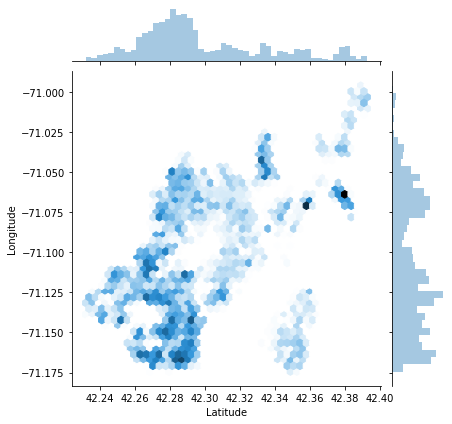

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt

#Compare joint frequencies of latitude and longitude
sns.jointplot(x=r1['Latitude'], y=r1['Longitude'], kind="hex")
plt.show()

### The Cut Function

Pandas has a cut function which makes this type of partioning work smoothly. The format is pd.cut(data, bins) where bins is the number of bins. It will equally split from minimum and maximum the data into these bins like a histogram. For example, look at the following:

In [19]:
print(pd.cut([1,2,3,4,5,6], 2))

[(0.995, 3.5], (0.995, 3.5], (0.995, 3.5], (3.5, 6.0], (3.5, 6.0], (3.5, 6.0]]
Categories (2, interval[float64]): [(0.995, 3.5] < (3.5, 6.0]]


The format right now is kind of ugly, we can change the labels to whatever we want. Let's label them 1 and 2.

In [20]:
print(pd.cut([1,2,3,4,5,6], 2, labels=[1, 2]))

[1, 1, 1, 2, 2, 2]
Categories (2, int64): [1 < 2]


Finally we can get the bins back with retbins=True.

In [21]:
out, bins = pd.cut([1,2,3,4,5,6], 2, labels=[1, 2], retbins=True)
print(bins)

[0.995 3.5   6.   ]


Apply this to our latitude and longitude to get a partioning. Use 100 cuts, and make a list from 0 to 99 to label the groups.

In [22]:
#Get the 100 bins for each latitude and longitude
r1['Latitude Group'], lat_bins = pd.cut(r1['Latitude'], 100, labels=list(range(100)), retbins=True)
r1['Longitude Group'], lon_bins = pd.cut(r1['Longitude'], 100, labels=list(range(100)), retbins=True)

The AV_LAND column is the assessed value for the land. Let's do a groupby on the two newly created groups to find the average land value within groups. Get rid of any properties with no values first.

In [23]:
#Get rid of bad records
r1 = r1[~pd.isnull(r1['AV_LAND'])]
r1 = r1[r1['AV_LAND'] > 0]

#Create the area averages
area_averages = r1.groupby(['Latitude Group', 'Longitude Group'])['AV_LAND'].mean().dropna()

#Reset the index
area_averages = area_averages.reset_index()
area_averages.columns = ['Latitude Group', 'Longitude Group', 'AV_LAND']
print(area_averages)

     Latitude Group Longitude Group        AV_LAND
0                 0              19  127000.000000
1                 0              20  133800.000000
2                 0              22  104212.500000
3                 0              23  109251.125000
4                 0              24  115850.000000
...             ...             ...            ...
2504             99              93  132350.000000
2505             99              94  119373.076923
2506             99              95  115983.333333
2507             99              96  103250.000000
2508             99              97  130100.000000

[2509 rows x 3 columns]


With the latitude and longitude labels from before, we can find the lower bounds and upper bounds. The groups correspond to the index of the lower bounds, and the group+1 corresponds to the upper bound.

In [24]:
#Get the bounds
area_averages['Latitude Lower'] = area_averages['Latitude Group'].apply(lambda x: lat_bins[x])
area_averages['Latitude Upper'] = area_averages['Latitude Group'].apply(lambda x: lat_bins[x+1])
area_averages['Longitude Lower'] = area_averages['Longitude Group'].apply(lambda x: lon_bins[x])
area_averages['Longitude Upper'] = area_averages['Longitude Group'].apply(lambda x: lon_bins[x+1])

print(area_averages)

     Latitude Group Longitude Group        AV_LAND Latitude Lower  \
0                 0              19  127000.000000      42.231939   
1                 0              20  133800.000000      42.231939   
2                 0              22  104212.500000      42.231939   
3                 0              23  109251.125000      42.231939   
4                 0              24  115850.000000      42.231939   
...             ...             ...            ...            ...   
2504             99              93  132350.000000      42.391025   
2505             99              94  119373.076923      42.391025   
2506             99              95  115983.333333      42.391025   
2507             99              96  103250.000000      42.391025   
2508             99              97  130100.000000      42.391025   

     Latitude Upper Longitude Lower Longitude Upper  
0         42.233705      -71.140474      -71.138690  
1         42.233705      -71.138690      -71.136906  
2        

As a check, let's make sure it makes sense if we iterated through all the rows and plotted the rectangles.

In [25]:
boston_map = folium.Map(location=[42.35, -71], zoom_start=12)

#Plot each rectangle
for i in area_averages.index:
    lat1, lat2, lon1, lon2 = area_averages.loc[i][['Latitude Lower', 'Latitude Upper',
                                                 'Longitude Lower', 'Longitude Upper']]
    folium.vector_layers.Rectangle([[lat1, lon1],
                               [lat1, lon2],
                               [lat2, lon2],
                               [lat2, lon1]]).add_to(boston_map)


boston_map

## Outliers

Let's move on to actually coloring these rectangles based upon the average values in areas. Before we begin, there is an important issue to solve: outliers. There are a few areas where the land is so much larger in value than others that it makes it so that everything would look cheap if we did a simple normalization. The histogram below illustrates this.

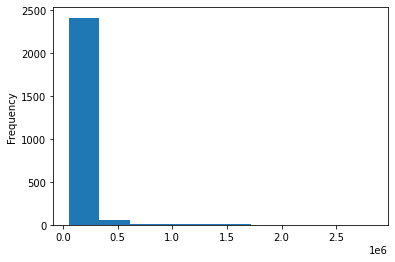

In [26]:
area_averages['AV_LAND'].plot.hist()
plt.show()

### Quantile

Pandas has a built in function, quantile, which will return the value at the percentile given to it. Let's see what the 95th percentile looks like.

In [27]:
#Find the 95th percentile value
print(area_averages['AV_LAND'].quantile(.95))

282100.0


## Clip 

The pandas function clip takes a lower bound and an upper bound and then returns the data where anything outside the bounds is clipped down to be equal to the bound. We can clip between 0 and the 95th percentile value to make it easier to get insights from this data!

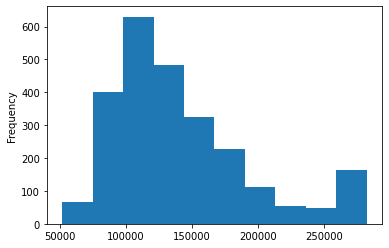

In [28]:
#Find the quantile value
q_value = area_averages['AV_LAND'].quantile(.95)

#Clip the data
area_averages['AV_LAND'] = area_averages['AV_LAND'].clip(0, q_value)

#Plot the data
area_averages['AV_LAND'].plot.hist()
plt.show()

## Red Green Mapping

I am going to define many functions below for mapping numerical values to red and green values. The first two are not necessary to understand. The first makes a conversion from an rgb value to a hex value and the second takes a value between -1 and 1 and converts negative values to darker versions of red depending on how negative they are and darker versions of green depending on how positive they are.

In [29]:
def rgb_to_hex(rgb):
    return "#" + '%02x%02x%02x' % rgb

def value_to_red_green(value):
    if value > 0:
        return (int(255-value*255), 255, int(255-value*255))
    else:
        value = abs(value)
        return (255, int(255-value*255), int(255-value*255))

The next function is going to define how we take a series of values and convert them to these red and green values. The first step is to normalize the values to be between -1 and 1 based on this formula:

$ Y_t = (\frac{X_t-MIN(X_t)}{MAX(X_t)-MIN(X_t)} - .5) * 2 $

After that it is converted to be a red green value.

In [30]:
def create_color_scale(values):
    #Find the value
    scale = ((values - values.min()) / (values.max() - values.min()) - .5) * 2
    
    #Map the conversion to rgb
    scale = scale.apply(value_to_red_green)
    
    #Map rgb to hex
    scale = scale.apply(rgb_to_hex)
    
    return scale

#Get the colors
area_averages["Color"] = create_color_scale(area_averages['AV_LAND'])
print(area_averages["Color"])

0       #ffa6a6
1       #ffb5b5
2       #ff7373
3       #ff7f7f
4       #ff8d8d
         ...   
2504    #ffb2b2
2505    #ff9595
2506    #ff8d8d
2507    #ff7171
2508    #ffadad
Name: Color, Length: 2509, dtype: object


Now we are able to plot all of these on the map with colors!

In [31]:
boston_map = folium.Map(location=[42.35, -71], zoom_start=12)

#Plot each rectangle
for i in area_averages.index:
    lat1, lat2, lon1, lon2 = area_averages.loc[i][['Latitude Lower', 'Latitude Upper',
                                                 'Longitude Lower', 'Longitude Upper']]
    
    #Get the color
    fill_color = area_averages.loc[i, "Color"]
    
    folium.vector_layers.Rectangle([[lat1, lon1],
                               [lat1, lon2],
                               [lat2, lon2],
                               [lat2, lon1]],  color='#000000', fill=True, fill_color=fill_color,fill_opacity=.8).add_to(boston_map)


boston_map

A modification that might make more sense is to do percentile ranking for the properties to color it so that the median value has no color, and then higher percentiles are more green, lower percentiles are more red.

In [32]:
def create_color_scale_percentile(values):
    #Find the value
    scale = (values.rank(pct=True) - .5) * 2
    
    #Map the conversion to rgb
    scale = scale.apply(value_to_red_green)
    
    #Map rgb to hex
    scale = scale.apply(rgb_to_hex)
    
    return scale

#Get the colors
area_averages["Color"] = create_color_scale_percentile(area_averages['AV_LAND'])
print(area_averages["Color"])

0       #fff8f8
1       #e5ffe5
2       #ff8484
3       #ffa3a3
4       #ffc7c7
         ...   
2504    #ebffeb
2505    #ffd8d8
2506    #ffc8c8
2507    #ff7e7e
2508    #f6fff6
Name: Color, Length: 2509, dtype: object


In [33]:
boston_map = folium.Map(location=[42.35, -71], zoom_start=12)

#Plot each rectangle
for i in area_averages.index:
    lat1, lat2, lon1, lon2 = area_averages.loc[i][['Latitude Lower', 'Latitude Upper',
                                                 'Longitude Lower', 'Longitude Upper']]
    
    #Get the color
    fill_color = area_averages.loc[i, "Color"]
    
    folium.vector_layers.Rectangle([[lat1, lon1],
                               [lat1, lon2],
                               [lat2, lon2],
                               [lat2, lon1]],  color='#000000', fill=True, fill_color=fill_color,fill_opacity=.8).add_to(boston_map)


boston_map

Let's create three new fields and also build a function to easily visualize any given field. The three new fields will be:

1. The land value divided by the surface area of the land.
2. The total value divided by the surface area of the land.
3. The building value divided by the land value.

In [34]:
df["AV_LAND/SF"] = df["AV_LAND"].where(df['AV_LAND'] != 0) / df['LAND_SF'].where(df['LAND_SF'] != 0)
df["AV_TOTAL/SF"] = df["AV_TOTAL"].where(df['AV_TOTAL'] != 0) / df['LAND_SF'].where(df['LAND_SF'] != 0)
df['AV_BLDG/AV_LAND'] = df['AV_BLDG'].where(df['AV_BLDG'] != 0) / df["AV_LAND"].where(df['AV_LAND'] != 0)


In [35]:
def create_map(LU, key):
    #Filter to sample where the LU matches
    sample = df[df['LU'] == LU].copy()
    
    #Get rid of any null values
    sample = sample[~pd.isnull(sample['Location'])]

    #Get the latitude
    sample['Latitude'] = sample['Location'].apply(lambda x: x.replace("(", "").replace(")", "").split("| ")[0]).astype(float)

    #Get the longitude
    sample['Longitude'] = sample['Location'].apply(lambda x: x.replace("(", "").replace(")", "").split("| ")[1]).astype(float)

    #Get rid of any that have 0 for the latitude (not a valid location)
    sample = sample[sample['Latitude'] != 0]
    
    #Find the min/max values
    lat_min = sample['Latitude'].min()
    lat_max = sample['Latitude'].max()
    lon_min = sample['Longitude'].min()
    lon_max = sample['Longitude'].max()
    
    #Create the groups
    sample['Latitude Group'], lat_bins = pd.cut(sample['Latitude'], 100, labels=list(range(100)), retbins=True)
    sample['Longitude Group'], lon_bins = pd.cut(sample['Longitude'], 100, labels=list(range(100)), retbins=True)
    
    
    
    #Get rid of null values
    sample = sample[~pd.isnull(sample[key])]

    #Create the area averages
    area_averages = sample.groupby(['Latitude Group', 'Longitude Group'])[key].mean().dropna()

    #Reset the index
    area_averages = area_averages.reset_index()
    area_averages.columns = ['Latitude Group', 'Longitude Group', key]
    
    #Get the colors
    area_averages["Color"] = create_color_scale_percentile(area_averages[key])
    
    #Get the bounds
    area_averages['Latitude Lower'] = area_averages['Latitude Group'].apply(lambda x: lat_bins[x])
    area_averages['Latitude Upper'] = area_averages['Latitude Group'].apply(lambda x: lat_bins[x+1])
    area_averages['Longitude Lower'] = area_averages['Longitude Group'].apply(lambda x: lon_bins[x])
    area_averages['Longitude Upper'] = area_averages['Longitude Group'].apply(lambda x: lon_bins[x+1])
    
    #Build the map
    boston_map = folium.Map(location=[42.35, -71], zoom_start=12)

    #Plot each rectangle
    for i in area_averages.index:
        lat1, lat2, lon1, lon2 = area_averages.loc[i][['Latitude Lower', 'Latitude Upper',
                                                     'Longitude Lower', 'Longitude Upper']]

        #Get the color
        fill_color = area_averages.loc[i, "Color"]

        folium.vector_layers.Rectangle([[lat1, lon1],
                                   [lat1, lon2],
                                   [lat2, lon2],
                                   [lat2, lon1]],  color='#000000', fill=True, fill_color=fill_color,fill_opacity=.8).add_to(boston_map)


    return boston_map

create_map("R1", "AV_LAND/SF")

In [36]:
create_map("A", "AV_TOTAL")

In [37]:
#Add in the hover tools

## Measuring Growth

Thanks to the fact that we also have real estate data from 2020, we are able to find how property values have grown over the last 5 years. Let's read in the data first.

In [38]:
df2 = pd.read_csv("2020 Real Estate.txt")

/Users/seanmcowen/anaconda/envs/FinanceAndPython/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3062: DtypeWarning: Columns (6,15,27,28,29,34,35,36,37,38,39,40,41,42,44,45,46,47,48,58,59,64,65,66,67,68,69,70,72,73,74) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


### Finding the Unique Identifier

The column PID will serve as our unique identifier, but first we need to investigate if it is indeed unique. Using value_counts, we can get the total number of instances for each unique label. If we do this with PID....

In [39]:
#Get PID value counts
print(df2['PID'].value_counts())

203520010     6
203506010     6
1902190000    6
303038200     6
1703777000    5
             ..
2005341004    1
501120000     1
103984000     1
2003998000    1
500695040     1
Name: PID, Length: 174714, dtype: int64


While it is not unique right now, there is one way that will both make it unique and also deal with values we don't want.... Filtering out anything that has an assessed value of $0 leads to the following value counts....

In [40]:
#Get rid of anything with a total value of 0
df2 = df2[df2['AV_TOTAL'] > 0]

#Check the value counts now
print(df2['PID'].value_counts())

2003371050    1
1603872014    1
103970020     1
701388000     1
1805747000    1
             ..
601828016     1
900846014     1
1702279000    1
2005341004    1
500695040     1
Name: PID, Length: 164967, dtype: int64


There is one other issue we must take care of.... In the 2015 real estate data, the PID has an underscore and is marked as a string. Let's convert it.

In [41]:
#Show top 5 PIDs prior
print(df["PID"].head(5))

#Get rid of the underscore and turn it into an integer
df['PID'] = df['PID'].str.replace("_", "").astype(int)

#Show top 5 PIDs after
print()
print()
print(df["PID"].head(5))

0    1302299000_
1    1302298000_
2    1302297000_
3    1302296000_
4    1302295000_
Name: PID, dtype: object


0    1302299000
1    1302298000
2    1302297000
3    1302296000
4    1302295000
Name: PID, dtype: int64


## Creating the Comparison

Let's build out comparison by first taking the different value measures within the 2015 dataset. We will also set the PID as the index.

In [42]:
#Build the basic set up
land_value = df.set_index("PID")[['AV_LAND', "AV_BLDG", "AV_TOTAL"]]
land_value.columns = ["2015 Land Value", "2015 Building Value", "2015 Total Value"]

We want to convert anything that has a value of 0 to be null which we can do with by using where and passing the condition it is greater than 0 (to prevent any issue of dividing by 0). Anything equal to 0 will be converted to NaN.

In [43]:
land_value = land_value.where(land_value > 0)

Join the 2020 values into the dataframe.

In [44]:
#Join 2020 values
land_value = land_value.join(df2.set_index("PID")[['AV_LAND', "AV_BLDG", "AV_TOTAL"]])

#Convert 0 values to NaN
land_value = land_value.where(land_value > 0)

#Rename columns
land_value.columns = ["2015 Land Value", "2015 Building Value", "2015 Total Value",
                     "2020 Land Value", "2020 Building Value", "2020 Total Value"]
print(land_value)

            2015 Land Value  2015 Building Value  2015 Total Value  \
PID                                                                  
100001000           93100.0             193000.0          286100.0   
100002000           83700.0             219300.0          303000.0   
100003000           83800.0             190700.0          274500.0   
100004000           83900.0             187300.0          271200.0   
100005000           93000.0             205200.0          298200.0   
...                     ...                  ...               ...   
2205668000         266300.0             431800.0          698100.0   
2205669000         573500.0            1348500.0         1922000.0   
2205670000         970500.0             866800.0         1837300.0   
2205670000         970500.0             866800.0         1837300.0   
2205670000         970500.0             866800.0         1837300.0   

            2020 Land Value  2020 Building Value  2020 Total Value  
PID                 

Find the growth rates by dividing 2020 values by 2015 values and subtracting 1.

In [45]:
#Compute the growth rates
land_value["Land Growth"] = land_value['2020 Land Value'] / land_value['2015 Land Value'] - 1
land_value["Building Growth"] = land_value['2020 Building Value'] / land_value['2015 Building Value'] - 1
land_value["Total Growth"] = land_value['2020 Total Value'] / land_value['2015 Total Value'] - 1

Let's see what the histograms look like.

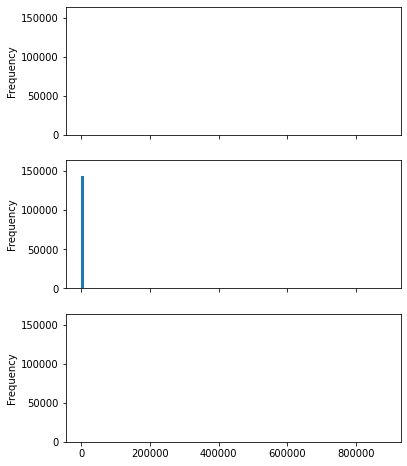

In [46]:
#Set up subplots
fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(6,8), sharex=True, sharey=True)

land_value["Land Growth"].plot.hist(ax=ax[0], bins=100)
land_value["Building Growth"].plot.hist(ax=ax[1], bins=100)
land_value["Total Growth"].plot.hist(ax=ax[2], bins=100)
plt.show()

Obviously there are outliers which we are not going to want to include for now. If we use the quantile function we can find the 1st percentile and the 99th percentile to see what the bounds are that hold 98% of the data excluding the 1% on each end. Let's see how it looks.

In [47]:
sample = land_value[['Land Growth', 'Building Growth', 'Total Growth']]
bound1 = sample.quantile(.01)
bound2 = sample.quantile(.99)

print(bound1)
print()
print()
print(bound2)

Land Growth       -0.211912
Building Growth   -0.209486
Total Growth      -0.125683
Name: 0.01, dtype: float64


Land Growth        1.971206
Building Growth    2.108214
Total Growth       1.877132
Name: 0.99, dtype: float64


If we combine this with where we can transform our data to put any values outside the bounds as null.

In [48]:
sample = sample.where((sample > bound1) & (sample < bound2))
print(sample)

            Land Growth  Building Growth  Total Growth
PID                                                   
100001000      1.147154         1.101554      1.116393
100002000      1.400239         1.128591      1.203630
100003000      1.404535         1.129523      1.213479
100004000      1.412396         1.019221      1.140855
100005000      1.148387         0.860136      0.950034
...                 ...              ...           ...
2205668000     0.568907         0.566929      0.567684
2205669000     0.312642         0.301224      0.304631
2205670000     0.357960         0.192432      0.279867
2205670000     0.357960         0.192432      0.279867
2205670000     0.357960         0.192432      0.279867

[168115 rows x 3 columns]


And now we can plot these histograms.

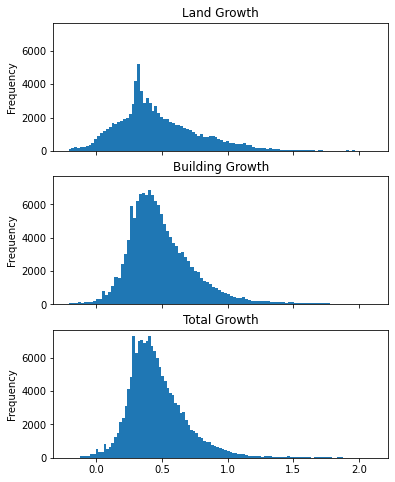

In [49]:
#Set up subplots
fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(6,8), sharex=True, sharey=True)

sample["Land Growth"].plot.hist(ax=ax[0], bins=100)
ax[0].set_title("Land Growth")
sample["Building Growth"].plot.hist(ax=ax[1], bins=100)
ax[1].set_title("Building Growth")
sample["Total Growth"].plot.hist(ax=ax[2], bins=100)
ax[2].set_title("Total Growth")
plt.show()

Let's also get the medians to see what the 5 year growth is in the middle.

In [50]:
print(land_value[['Land Growth', 'Building Growth','Total Growth']].median())

Land Growth        0.401239
Building Growth    0.446657
Total Growth       0.424826
dtype: float64


Let's bring the growth values into the dataframe by joining on the PID.

In [51]:
df = df.join(land_value[['Land Growth', 'Building Growth', 'Total Growth']], on='PID')

Now we can plot the values on the map!

In [52]:
create_map("R1", "Land Growth")